In [ ]:
from astroquery.sdss import SDSS
from astropy import coordinates as coords
from astropy import units as u
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from astropy.wcs import WCS

im_path = 'F:/images/'

for row in range(4,100):
    id = pd.read_csv('final_sdss_catalogue.csv', sep=',', usecols=['SDSS'],squeeze=True)[row]
    ra = pd.read_csv('final_sdss_catalogue.csv', sep=',', usecols=['ra'],squeeze=True)[row]
    dec = pd.read_csv('final_sdss_catalogue.csv', sep=',', usecols=['dec'],squeeze=True)[row]
    
    pos = coords.SkyCoord(ra, dec, unit=u.deg)
    xid = SDSS.query_region(pos,obj_names=id)
    
    header = SDSS.get_images(matches=xid, band='r')[0][0].header
    r = SDSS.get_images(matches=xid, band='r')[0][0].data
    g = SDSS.get_images(matches=xid, band='g')[0][0].data
    b = SDSS.get_images(matches=xid, band='u')[0][0].data
    
    assert r.ndim == 2 and g.ndim == 2 and b.ndim == 2
    rgb = (r[..., np.newaxis], g[..., np.newaxis], b[..., np.newaxis])
    data = np.concatenate(rgb, axis=-1)
    wcs_info = WCS(header)
    
    fig = plt.figure(figsize = (8,8))
    ax = plt.subplot(111, projection = wcs_info)
    ax.imshow(data, vmin = 0,vmax = np.percentile(data,99),origin = "lower")
    plt.xlabel('Right Ascension')
    plt.ylabel('Declination')
    plt.title("SDSS Image Data for Object at Row {0}, Color-stacked".format(row))
    ax.scatter(pos.ra,pos.dec,edgecolors='r',facecolors='none',s=40,transform=ax.get_transform('world'))
    
    
    plt.savefig(im_path + 'Object cs{0}.png'.format(row),dpi=1000)
    plt.close()
    print(row)

In [ ]:
from astroquery.sdss import SDSS
from astropy import coordinates as coords
from astropy import units as u
from astropy.table import Table
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from astropy.wcs import WCS
import sys
import urllib
import pickle
from astroquery.simbad import Simbad

for row in range(0,10000):
    id = pd.read_csv('final_sdss_catalogue.csv', sep=',', usecols=['SDSS'],squeeze=True)[row]
    ra = pd.read_csv('final_sdss_catalogue.csv', sep=',', usecols=['ra'],squeeze=True)[row]
    dec = pd.read_csv('final_sdss_catalogue.csv', sep=',', usecols=['dec'],squeeze=True)[row]
   
    pos = coords.SkyCoord(ra, dec, unit=u.deg)
    xid = SDSS.query_region(pos,obj_names=id)
   
    #sp = SDSS.get_spectra(matches=xid)[0]
    im = SDSS.get_images(matches=xid, band='g')[0]
   
    data = im[0].data
    wcs_info = WCS(im[0].header)
   
    fig = plt.figure(figsize = (8,8))
    ax = plt.subplot(111, projection = wcs_info)
    ax.imshow(data, vmin = 0,vmax = np.percentile(data,99),cmap=plt.cm.bone,origin = "lower")
    plt.xlabel('Right Ascension')
    plt.ylabel('Declination')
    plt.title("SDSS Image Data for Object at Row {0}".format(row))
    ax.scatter(pos.ra,pos.dec,edgecolors='r',facecolors='none',s=30,transform=ax.get_transform('world'))
   
   
    plt.savefig(im_path + 'Object {0}.png'.format(row),dpi=1000)
    plt.close()
    print(row)

In [ ]:
from astroquery.sdss import SDSS
from astropy import coordinates as coords
from astropy import units as u
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from astropy.wcs import WCS
from astropy.io import fits
from reproject import reproject_interp
from astroquery.simbad import Simbad
from astropy.visualization import make_lupton_rgb
import warnings
warnings.filterwarnings("ignore")

def hms_to_dd(hms):
    coord_list = hms.split(' ')
    for n in range(3-len(coord_list)):
        coord_list.append(str(0))
    return (float(coord_list[0]) * 15) + ((float(coord_list[1]) / 60) *15) + ((float(coord_list[2]) /(60**2))*15)

def dms_to_dd(dms):
    coord_list = dms.split(' ')
    for n in range(3-len(coord_list)):
        coord_list.append(str(0))
    if int(coord_list[0]) < 0:
        a = -1
    else:
        a = 1
    return float(coord_list[0]) + ((a * float(coord_list[1]) / 60)) + (a*(float(coord_list[2]) /(60**2)))

def find_object(name):
    result_table = Simbad.query_object(name)
    ra = hms_to_dd(result_table['RA'][0])
    dec = dms_to_dd(result_table['DEC'][0])

    pos = coords.SkyCoord(ra, dec, unit=u.deg)
    xid = SDSS.query_region(pos)
    return xid

def make_rgb(xid,obs,freq='irg',black_point=0,stretch=0.5,Q=8):
    im_r = SDSS.get_images(matches=xid, band=freq[0])[obs][0]
    im_g = SDSS.get_images(matches=xid, band=freq[1])[obs][0]
    im_b = SDSS.get_images(matches=xid, band=freq[2])[obs][0]

    new_im_g, footprint_g = reproject_interp(im_g, im_r.header)
    new_im_b, footprint_b = reproject_interp(im_b, im_r.header)

    im_rgb = make_lupton_rgb(im_r.data, new_im_g, new_im_b, minimum=black_point,Q=Q,stretch=stretch)
    return im_rgb,im_r.header

def av_rgb(xid,freq='irg',black_point=0,Q=8,stretch=0.5):
    images_list = []
    for obs in range(len(xid)):
        color_list = []
        for color in freq:
            color_list.append(SDSS.get_images(matches=xid, band=color)[obs][0])
        images_list.append(color_list)
        print("Observation {0} complete".format(obs))
    
    header_info = images_list[0][0].header
    for o in range(len(images_list)):
        for c in range(len(images_list[o])):
            images_list[o][c],a = reproject_interp(images_list[o][c],header_info)
    r_list = []
    g_list = []
    b_list = []
    for n in range(len(images_list)):
        r_list.append(images_list[n][0])
        g_list.append(images_list[n][1])
        b_list.append(images_list[n][2])
        
    av_r = np.mean(r_list,axis=0)
    av_g = np.mean(g_list,axis=0)
    av_b = np.mean(b_list,axis=0)

    im_rgb = make_lupton_rgb(av_r, av_g, av_b, minimum=black_point,Q=Q,stretch=stretch)
    return im_rgb,header_info,av_r,av_g,av_b,images_list

In [ ]:
name = 'M76'
xid = find_object(name)[:1]
print(str(name) + ' was observed ' + str(len(xid)) + ' times')
im_rgb, header_info = make_rgb(xid,0,freq='irg')

plt.figure(figsize=(14,20),dpi=400)
ax = plt.subplot(projection=WCS(header_info))
ax.imshow(im_rgb, origin='lower')
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')
ax.set_title(name)

Messier 97 was observed 2 times
Observation 0 complete
Observation 1 complete


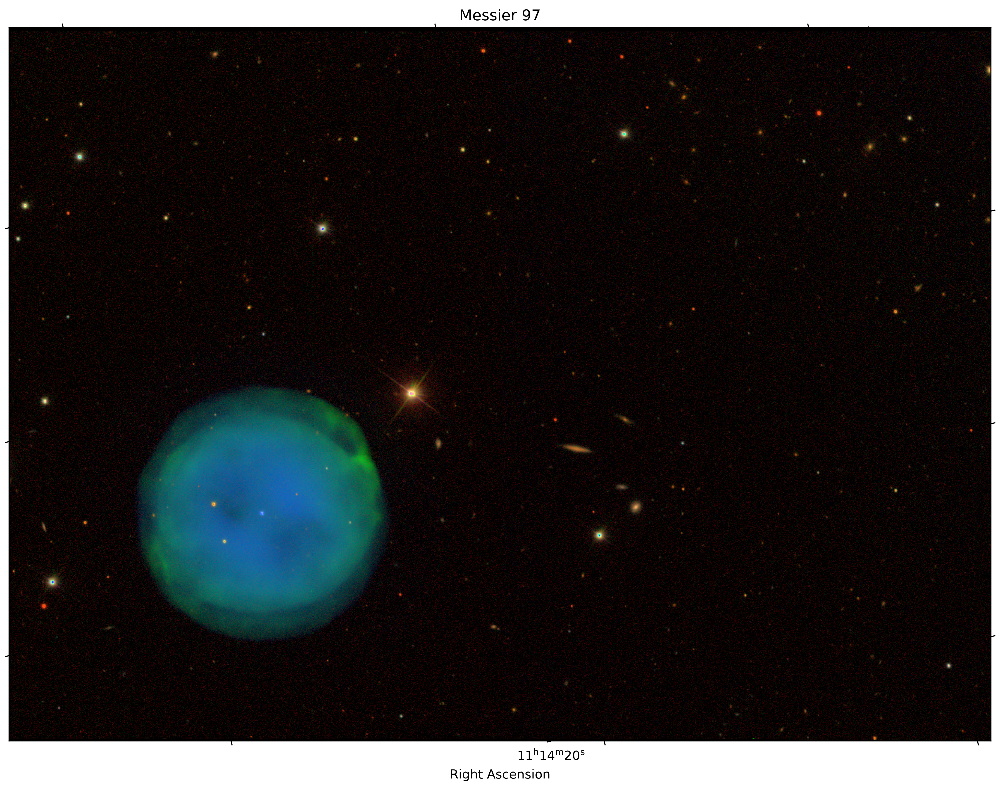

In [84]:
name = 'Messier 97'
xid = find_object(name)
print(str(name) + ' was observed ' + str(len(xid)) + ' times')
im_rgb,header_info,av_r,av_g,av_b,images_list = av_rgb(xid)

plt.figure(figsize=(14,20),dpi=400)
ax = plt.subplot(projection=WCS(header_info))
ax.imshow(im_rgb, origin='lower')
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')
ax.set_title(name)

plt.savefig(name+'.png')

In [ ]:
for n in range(1,1500):
    try:
        xid = find_object('NGC ' + str(n))
    except:
        continue
    if xid is None:
        continue
    elif len(xid)>2:
        print('NGC ' + str(n) + ' ' + str(len(xid)))

In [ ]:
for n in range(50):
    try:
        t = find_object("HH "+str(n))
    except:
        continue
    if t is None:
        continue
    else:
        print(n)
    

In [ ]:
find_object('NGC 1491',data_release=14)